# MMEditing Tutorial - Super-Resolution (Part 2)
Welcome to MMEditing! This is the official colab tutorial for super-resolutin task (the second part). 

In this tutorial, you will learn:
- enhanced super-resolution models for perceptual quality.
- a balanced technique balancing PSNR-oritend outputs and perceptual restorations. 

Let's start!

# Install MMEditing

In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# Install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5.1+cu101 torchvision==0.6.1+cu101 -f https://download.pytorch.org/whl/torch_stable.html

# Install mmcv from source
!rm -rf mmcv
!git clone https://github.com/open-mmlab/mmcv.git
%cd mmcv
!MMCV_WITH_OPS=1 pip install .
%cd ..

# Install mmediting, it may take a while to install mmcv-full
!rm -rf mmediting
!git clone https://github.com/open-mmlab/mmediting.git
%cd mmediting
!pip install -r requirements.txt
!pip install -e .

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Requirement already up-to-date: torch==1.5.1+cu101 in /usr/local/lib/python3.6/dist-packages (1.5.1+cu101)
Requirement already up-to-date: torchvision==0.6.1+cu101 in /usr/local/lib/python3.6/dist-packages (0.6.1+cu101)
Cloning into 'mmcv'...
remote: Enumerating objects: 74, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 3484 (delta 27), reused 22 (delta 7), pack-reused 3410
Receiving objects: 100% (3484/3484), 5.70 MiB | 7.47 MiB/s, done.
Resolving deltas: 100% (2311/2311), done.
/content/mmcv
Processing /content/mmcv
     |████████████████████████████████| 194kB 8.6MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.0.3-cp36-cp36m-linux_x86_64.whl size=16217337 sha256=e99ac66af6123c997ff3fed506040ece7585221df43f3146f8227421fc1244fe
  Stored in directory: /tmp/pip-ephem-wheel-cache-v89eh_24/wheels/34/64/a6/92de36f9cc2a71f8e295327009ecfa148ddb9d

In [3]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMEditing installation
import mmedit
print(mmedit.__version__)

1.5.1+cu101 True
0.5.0+2a66624


# SRCNN Recap
We have run SRCNN by ourselves in Part 1 and gotten familiar with SRCNN.

In a word, SRCNN is a very simple CNN-based method for super-resolution. It only contains three convolution layers, each performing a function:

- The first convolution layer performs feature extraction;
- The second convolution layer with activation functions performs non-linear mapping;
- The last convolution layer converts the features back to images with reconstruction.

With increasing model capacity and improved model structures, will the model performs better?

Now let's try a much larger model.

# From SRCNN to A Larger Model
Here, we choose the RRDB-Net, which is short for Residual in Residual Dense Block Network.

Let's fist look at its network structure! You are not required to know every detail of it but just have a glance at it.

The overall structure is as follows:

![RRDB-Net](https://raw.githubusercontent.com/xinntao/public-figures/master/MMEditing-Tutorial/RRDB-Net.png)

And each basic block inside it is RRDB, which combines the merits of ResNet and DenseNet:

![RRDB](https://raw.githubusercontent.com/xinntao/public-figures/master/MMEditing-Tutorial/RRDB.png)

Now let's run a pre-trained RRDB-Net with baboon!

# Inference with RRDB-Net in MMEditing

In [4]:
# download pre-trained models
!mkdir checkpoints
!wget -c https://openmmlab.oss-accelerate.aliyuncs.com/mmediting/restorers/esrgan/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth \
    -O checkpoints/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth
!wget -c https://openmmlab.oss-accelerate.aliyuncs.com/mmediting/restorers/srcnn/srcnn_x4k915_1x16_1000k_div2k_20200608-4186f232.pth \
    -O checkpoints/srcnn_x4k915_1x16_1000k_div2k_20200608-4186f232.pth
!wget -c https://openmmlab.oss-accelerate.aliyuncs.com/mmediting/restorers/esrgan/esrgan_x4c64b23g32_1x16_400k_div2k_20200508-f8ccaf3b.pth \
    -O checkpoints/esrgan_x4c64b23g32_1x16_400k_div2k_20200508-f8ccaf3b.pth

--2020-07-22 09:19:20--  https://openmmlab.oss-accelerate.aliyuncs.com/mmediting/restorers/esrgan/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth
Resolving openmmlab.oss-accelerate.aliyuncs.com (openmmlab.oss-accelerate.aliyuncs.com)... 47.254.186.225
Connecting to openmmlab.oss-accelerate.aliyuncs.com (openmmlab.oss-accelerate.aliyuncs.com)|47.254.186.225|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 66914297 (64M) [application/octet-stream]
Saving to: ‘checkpoints/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth’

checkpoints/esrgan_ 100%[===================>]  63.81M  13.0MB/s    in 5.8s    

2020-07-22 09:19:26 (11.1 MB/s) - ‘checkpoints/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth’ saved [66914297/66914297]

--2020-07-22 09:19:27--  https://openmmlab.oss-accelerate.aliyuncs.com/mmediting/restorers/srcnn/srcnn_x4k915_1x16_1000k_div2k_20200608-4186f232.pth
Resolving openmmlab.oss-accelerate.aliyuncs.com (open

In [5]:
# download data
!mkdir data
!wget https://raw.githubusercontent.com/open-mmlab/mmediting/master/tests/data/lq/baboon_x4.png
!wget https://raw.githubusercontent.com/open-mmlab/mmediting/master/tests/data/gt/baboon.png
!wget https://raw.githubusercontent.com/xinntao/public-figures/master/MMEditing-Tutorial/zebra_x4.png
!mv baboon_x4.png ./data/baboon_x4.png
!mv baboon.png ./data/baboon.png
!mv zebra_x4.png ./data/zebra_x4.png

--2020-07-22 09:20:08--  https://raw.githubusercontent.com/open-mmlab/mmediting/master/tests/data/lq/baboon_x4.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 33918 (33K) [image/png]
Saving to: ‘baboon_x4.png’

baboon_x4.png       100%[===================>]  33.12K  --.-KB/s    in 0.004s  

2020-07-22 09:20:08 (7.97 MB/s) - ‘baboon_x4.png’ saved [33918/33918]

--2020-07-22 09:20:10--  https://raw.githubusercontent.com/open-mmlab/mmediting/master/tests/data/gt/baboon.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 553249 (540K) [imag

In [6]:
! mkdir results
# inference with SRCNN
! python demo/restoration_demo.py configs/restorers/srcnn/srcnn_x4k915_g1_1000k_div2k.py checkpoints/srcnn_x4k915_1x16_1000k_div2k_20200608-4186f232.pth data/baboon_x4.png results/baboon_SRCNN.png
# inference with RRDB-Net
! python demo/restoration_demo.py configs/restorers/esrgan/esrgan_psnr_x4c64b23g32_g1_1000k_div2k.py checkpoints/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth data/baboon_x4.png results/baboon_RRDB-Net.png

Let's look inside the codes!

We will write python codes with MMEditing high-level APIs to perform super-resolution.

In [7]:
import mmcv
import torch
from mmedit.apis import init_model, restoration_inference
from mmedit.core import tensor2img

# configuations 
config = 'configs/restorers/esrgan/esrgan_psnr_x4c64b23g32_g1_1000k_div2k.py'
checkpoint = 'checkpoints/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth'
img_path = 'data/baboon_x4.png'
save_path = 'results/baboon_RRDB-Net.png'

# initilize model
model = init_model(
        config, checkpoint, device=torch.device('cuda'))

# inference
output = restoration_inference(model, img_path)

# change the network output to images
output = tensor2img(output)

# save images
mmcv.imwrite(output, save_path)

True

# Visulize Outputs

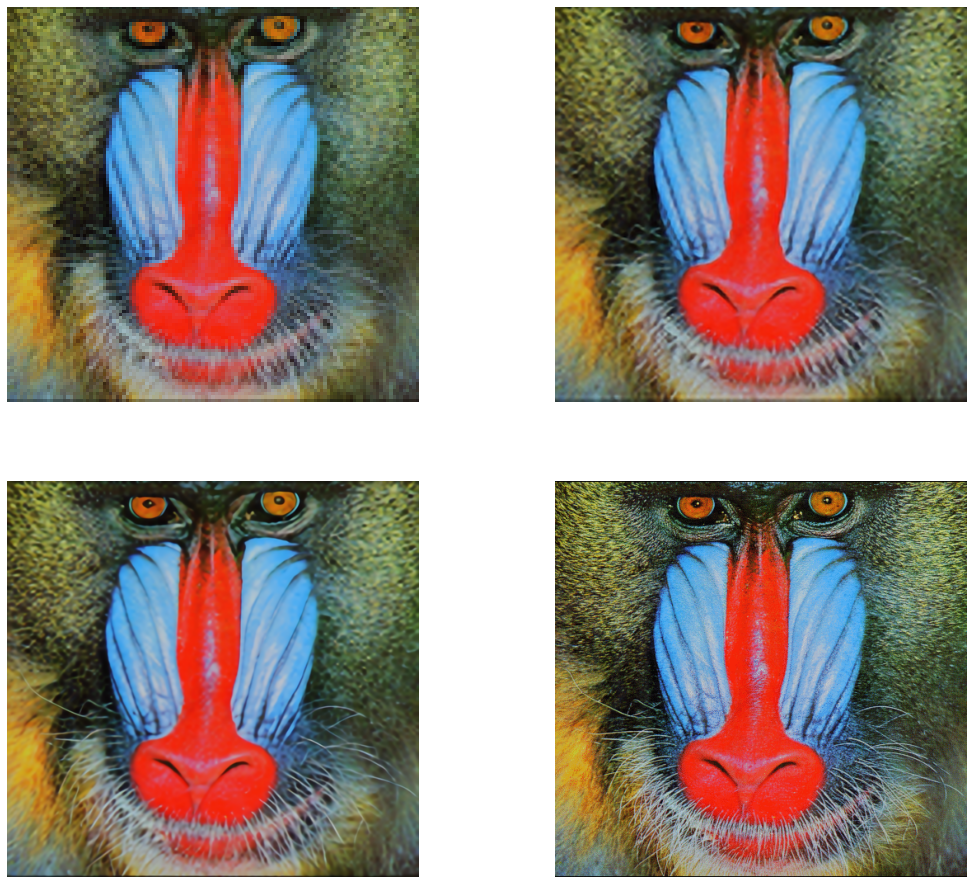

In [13]:
%matplotlib inline 
import mmcv
import matplotlib.pyplot as plt

# load LR and GT images
img_lr = mmcv.imread('./data/baboon_x4.png', channel_order='rgb')  # read LR image
img_gt = mmcv.imread('./data/baboon.png', channel_order='rgb')  # read GT (Ground-Truth) image

# load SRCNN and RRDB-Net results
img_srcnn = mmcv.imread('./results/baboon_SRCNN.png', channel_order='rgb')
img_rrdb_net = mmcv.imread('./results/baboon_RRDB-Net.png', channel_order='rgb')

# plot figures
fig = plt.figure(figsize=(18, 16))
ax1 = fig.add_subplot(2, 2, 1)  # 2 rows, 2 columns, the top left image  
ax1.axis('off')
ax2 = fig.add_subplot(2, 2, 2)  # 2 rows, 2 columns, the top right image  
ax2.axis('off')
ax3 = fig.add_subplot(2, 2, 3)  # 2 rows, 2 columns, the top right image  
ax3.axis('off')
ax4 = fig.add_subplot(2, 2, 4)  # 2 rows, 2 columns, the bottom right image  
ax4.axis('off')
ax1.imshow(img_lr)
ax2.imshow(img_srcnn)
ax3.imshow(img_rrdb_net)
ax4.imshow(img_gt)

The top left is the input low-resolution result. The top right is the SRCNN output. The bottom left the larger RRDB-Net result, while the bottom right is the Ground-truth. 

From the above results, we can see that with larger model capacity and improved structures, we can recover better results with sharper edges.

### PSNR (Peak Signal-to-Noise Ratio)

We usually measure the output with Peak Signal-to-Noise Ratio, often abbreviated PSNR. It is an engineering term for the ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation.

We can call MMEditing API to calculate PSNR as follows. 


In [ ]:
from mmedit.core.evaluation import psnr, niqe
# Bicubic images
h, w, c = img_lr.shape
img_bic, _, _ = mmcv.imresize(img_lr, (w * 4, h * 4), 'bicubic')
psnr_bic = psnr(img_bic, img_gt, crop_border=4, input_order='HWC')
print('PSNR for bicubic image: ', psnr_bic)

In [22]:
# PSNRs for SRCNN and RRDB-Net
psnr_srcnn = psnr(img_srcnn, img_gt, crop_border=4, input_order='HWC')
psnr_rrdb_net = psnr(img_rrdb_net, img_gt, crop_border=4, input_order='HWC')
print('PSNR for SRCNN image: ', psnr_srcnn)
print('PSNR for RRDB-Net image: ', psnr_rrdb_net)

PSNR for SRCNN image:  29.12507085960765
PSNR for RRDB-Net image:  29.241919215172977


# Perceptual Quality

However, as we observe from the above images, even the output of RRDB-Net has sharper edges than SRCNN outputs, the textures of the baboon is still unsatisfactory, especially the beard. 

For our human beings, we prefer the perceptual quality than PSNR-oriented PSNR. 

Therefore, we introduce another metric that is able to reflect the perceptual quality of super-resolution - NIQE.


### NIQE (Natural Image Quality Evaluator) 
NIQE is a non-reference image quality evaluator that assesses image quality without knowledge of anticipated distortions or human opinions of them. The quality of the distorted image is expressed as a simple distance metric between the
model statistics and those of the distorted image. Such a model has great potential to be
applied in unconstained environments.

Paper: Making a "Completely Blind" Image Quality Analyzer.

We can also call NIQE functions using MMEditing APIs.

In [24]:
niqe_bic = niqe(img_bic, crop_border=4, input_order='HWC')
niqe_srcnn = niqe(img_srcnn, crop_border=4, input_order='HWC')
niqe_rreb_net = niqe(img_rrdb_net, crop_border=4, input_order='HWC')
niqe_gt = niqe(img_gt, crop_border=4, input_order='HWC')

print('NIQE for bicubic image: ', niqe_bic)
print('NIQE for SRCNN image: ', niqe_srcnn)
print('NIQE for RRDB-Net image: ', niqe_rreb_net)
print('NIQE for GT image: ', niqe_gt)

NIQE for bicubic image:  [[11.01545448]]
NIQE for SRCNN image:  [[7.35630779]]
NIQE for RRDB-Net image:  [[5.0794611]]
NIQE for GT image:  [[6.22157055]]


Let's try ESRGAN, which is pursuing the perceptual quality.

The network structure is the same as that of RRDB-net. However, it is trained with different objective/loss functions.


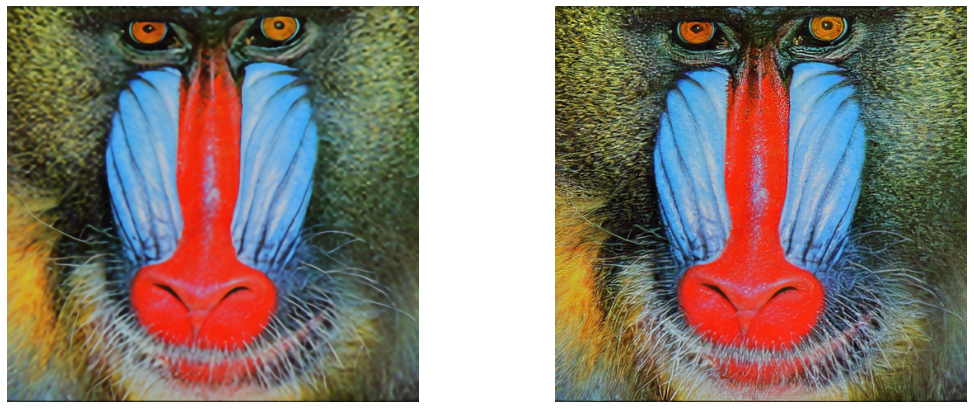

In [30]:
# configuations 
config = 'configs/restorers/esrgan/esrgan_x4c64b23g32_g1_400k_div2k.py'
checkpoint = 'checkpoints/esrgan_x4c64b23g32_1x16_400k_div2k_20200508-f8ccaf3b.pth'
img_path = 'data/baboon_x4.png'
save_path = 'results/baboon_ESRGAN.png'

# initilize model
model = init_model(
        config, checkpoint, device=torch.device('cuda'))

# inference
output = restoration_inference(model, img_path)
output = tensor2img(output)

mmcv.imwrite(output, save_path)

# visualize 
img_esrgan = mmcv.imread('results/baboon_ESRGAN.png', channel_order='rgb')

fig = plt.figure(figsize=(18, 16))
ax1 = fig.add_subplot(2, 2, 1)
ax1.axis('off')
ax2 = fig.add_subplot(2, 2, 2)
ax2.axis('off')

ax1.imshow(img_rrdb_net)
ax2.imshow(img_esrgan)

Is it much clearer? This is the magic of Generative Adversarial Network!

In [37]:
# Calculate NIQE of ESRGAN
niqe_esrgan = niqe(img_esrgan, crop_border=4, input_order='HWC')

print('NIQE for bicubic image: ', niqe_bic)
print('NIQE for SRCNN image: ', niqe_srcnn)
print('NIQE for RRDB-Net image: ', niqe_rreb_net)
print('NIQE for ESRGAN image: ', niqe_esrgan)
print('NIQE for GT image: ', niqe_gt)

NIQE for bicubic image:  [[11.01545448]]
NIQE for SRCNN image:  [[7.35630779]]
NIQE for RRDB-Net image:  [[5.0794611]]
NIQE for ESRGAN image:  [[4.21204823]]
NIQE for GT image:  [[6.22157055]]


In [ ]:
We can also calculate the NIQEs and from these values, we can see that the ESRGAN could produce lower NIQE, indicating better visual quality. 

However, the metric is not perfect. From the above values, we can also see that the GT image has a higher NIQE value than outputs of RRDB-Net and ESRGAN, which is not reasonable.

# Try it by yourself

You can use other images from the dataset and super-resolve them~

In [34]:
# inference with SRCNN
! python demo/restoration_demo.py configs/restorers/srcnn/srcnn_x4k915_g1_1000k_div2k.py checkpoints/srcnn_x4k915_1x16_1000k_div2k_20200608-4186f232.pth data/zebra_x4.png results/zebra_SRCNN.png
# inference with RRDB-Net
! python demo/restoration_demo.py configs/restorers/esrgan/esrgan_psnr_x4c64b23g32_g1_1000k_div2k.py checkpoints/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth data/zebra_x4.png results/zebra_RRDB-Net.png
# inference with ESRGAN
! python demo/restoration_demo.py configs/restorers/esrgan/esrgan_x4c64b23g32_g1_400k_div2k.py checkpoints/esrgan_x4c64b23g32_1x16_400k_div2k_20200508-f8ccaf3b.pth data/zebra_x4.png results/zebra_ESRGAN.png

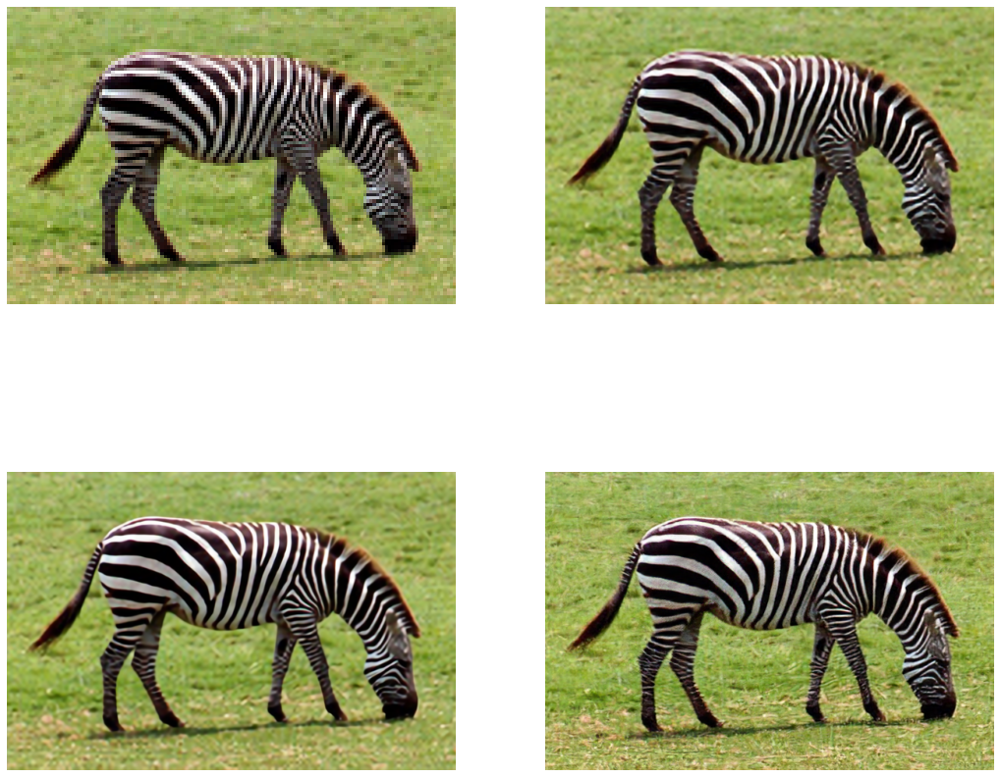

In [35]:
# load LR and GT images
zebra_lr = mmcv.imread('./data/zebra_x4.png', channel_order='rgb')  # read GT (Ground-Truth) image
# load SRCNN and RRDB-Net results
zebra_srcnn = mmcv.imread('./results/zebra_SRCNN.png', channel_order='rgb')
zebra_rrdb_net = mmcv.imread('./results/zebra_RRDB-Net.png', channel_order='rgb')
# load ESRGAN result
zebra_esrgan = mmcv.imread('./results/zebra_ESRGAN.png', channel_order='rgb')

# plot figures
fig = plt.figure(figsize=(18, 16))
ax1 = fig.add_subplot(2, 2, 1)  # 2 rows, 2 columns, the top left image  
ax1.axis('off')
ax2 = fig.add_subplot(2, 2, 2)  # 2 rows, 2 columns, the top right image  
ax2.axis('off')
ax3 = fig.add_subplot(2, 2, 3)  # 2 rows, 2 columns, the top right image  
ax3.axis('off')
ax4 = fig.add_subplot(2, 2, 4)  # 2 rows, 2 columns, the bottom right image  
ax4.axis('off')
ax1.imshow(zebra_lr)
ax2.imshow(zebra_srcnn)
ax3.imshow(zebra_rrdb_net)
ax4.imshow(zebra_esrgan)

# Balance PSNR criterion and perceptual quality

How to balance the PSNR-oriented results and GAN effects to meet various user flavors and application scenarios. 

We introduce a simple yet effective technique to achieve this goal - Deep Network Interpolation.

It actually interplote two networks! 

Sounds crazy? Let's look at what will happen!



This is the illustration of Deep Network interpolation:
Provided with a model for a particular effect A, we fine-tune it to realize another relevant
effect B. DNI applies linear interpolation for all the corresponding parameters
of these two deep networks. Various interpolated models can then be derived by a controllable interpolation coeffcient. Performing feed-forward operations on these interpolated models using the same input allows us to
outputs with a continuous transition between the different effects A and B.

![](https://raw.githubusercontent.com/xinntao/public-figures/master/MMEditing-Tutorial/DNI_1.jpg)

![](https://raw.githubusercontent.com/xinntao/public-figures/master/MMEditing-Tutorial/DNI_2.jpg)

Let's first look at the parameters of the network.

In [38]:
import torch
net_rrdb_net = torch.load('checkpoints/esrgan_psnr_x4c64b23g32_1x16_1000k_div2k_20200420-bf5c993c.pth')

for key, value in net_rrdb_net['state_dict'].items():
  print(key)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

generator.conv_first.weight
generator.conv_first.bias
generator.body.0.rdb1.conv1.weight
generator.body.0.rdb1.conv1.bias
generator.body.0.rdb1.conv2.weight
generator.body.0.rdb1.conv2.bias
generator.body.0.rdb1.conv3.weight
generator.body.0.rdb1.conv3.bias
generator.body.0.rdb1.conv4.weight
generator.body.0.rdb1.conv4.bias
generator.body.0.rdb1.conv5.weight
generator.body.0.rdb1.conv5.bias
generator.body.0.rdb2.conv1.weight
generator.body.0.rdb2.conv1.bias
generator.body.0.rdb2.conv2.weight
generator.body.0.rdb2.conv2.bias
generator.body.0.rdb2.conv3.weight
generator.body.0.rdb2.conv3.bias
generator.body.0.rdb2.conv4.weight
generator.body.0.rdb2.conv4.bias
generator.body.0.rdb2.conv5.weight
generator.body.0.rdb2.conv5.bias
generator.body.0.rdb3.conv1.weight
generator.body.0.rdb3.conv1.bias
generator.body.0.rdb3.conv2.weight
generator.body.0.rdb3.conv2.bias
generator.body.0.rdb3.conv3.weight
generator.body.0.rdb3.conv3.bias
generator.body.0.rdb3.conv4.weight
generator.body.0.rdb3.conv4

In [44]:
net_esrgan = torch.load('checkpoints/esrgan_x4c64b23g32_1x16_400k_div2k_20200508-f8ccaf3b.pth')
alpha = 0.8
interpolated_net = {'meta': f'interpolated network with alpha {alpha}', 'state_dict': dict()}
for key, value in net_rrdb_net['state_dict'].items():
  interpolated_net['state_dict'][key] = alpha * net_rrdb_net['state_dict'][key] + (1-alpha) * net_esrgan['state_dict'][key]

torch.save(interpolated_net, './interpolated_net.pth')

## Inference with the interpolated network

The model and loaded state dict do not match exactly

missing keys in source state_dict: discriminator.conv0_0.weight, discriminator.conv0_0.bias, discriminator.conv0_1.weight, discriminator.bn0_1.weight, discriminator.bn0_1.bias, discriminator.bn0_1.running_mean, discriminator.bn0_1.running_var, discriminator.conv1_0.weight, discriminator.bn1_0.weight, discriminator.bn1_0.bias, discriminator.bn1_0.running_mean, discriminator.bn1_0.running_var, discriminator.conv1_1.weight, discriminator.bn1_1.weight, discriminator.bn1_1.bias, discriminator.bn1_1.running_mean, discriminator.bn1_1.running_var, discriminator.conv2_0.weight, discriminator.bn2_0.weight, discriminator.bn2_0.bias, discriminator.bn2_0.running_mean, discriminator.bn2_0.running_var, discriminator.conv2_1.weight, discriminator.bn2_1.weight, discriminator.bn2_1.bias, discriminator.bn2_1.running_mean, discriminator.bn2_1.running_var, discriminator.conv3_0.weight, discriminator.bn3_0.weight, discriminator.bn3_0.bias, discriminator.

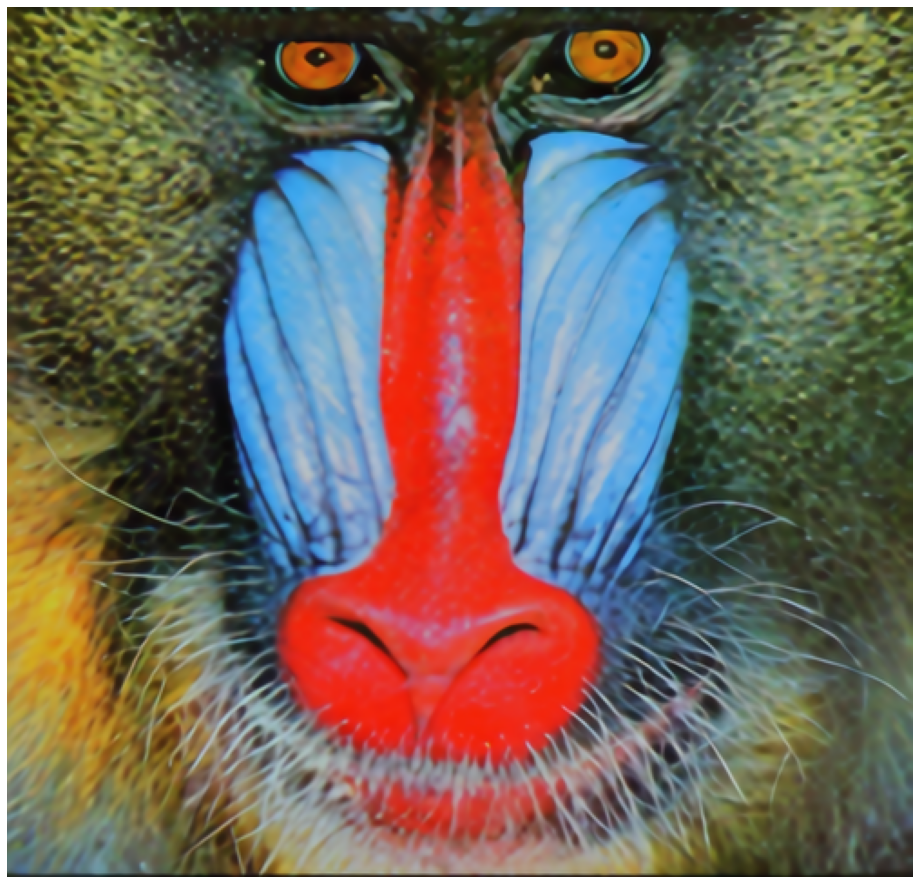

In [45]:
config = 'configs/restorers/esrgan/esrgan_x4c64b23g32_g1_400k_div2k.py'
checkpoint = 'interpolated_net.pth'
img_path = 'data/baboon_x4.png'
save_path = 'results/baboon_ESRGAN_interpolated.png'

model = init_model(
        config, checkpoint, device=torch.device('cuda'))

output = restoration_inference(model, img_path)
output = tensor2img(output)

mmcv.imwrite(output, save_path)

# visualize 
img_interp = mmcv.imread('results/baboon_ESRGAN_interpolated.png', channel_order='rgb')

fig = plt.figure(figsize=(18, 16))
ax1 = fig.add_subplot(1, 1, 1)
ax1.axis('off')
ax1.imshow(img_interp)

Cannot see the difference? Now let's do some fancy work!

In [47]:
import numpy as np
for alpha in list(np.arange(0, 1.05, 0.05)):
    print(f'Interpolating with alpha = {alpha:.2f}...')
    interpolated_net = {'meta': f'interpolated network with alpha {alpha}', 'state_dict': dict()}
    for key, value in net_rrdb_net['state_dict'].items():
        interpolated_net['state_dict'][key] = alpha * net_rrdb_net['state_dict'][key] + (1-alpha) * net_esrgan['state_dict'][key]

    torch.save(interpolated_net, f'./interpolated_net_{int(alpha*100):03d}.pth')

Interpolating with alpha = 0.00...
Interpolating with alpha = 0.05...
Interpolating with alpha = 0.10...
Interpolating with alpha = 0.15...
Interpolating with alpha = 0.20...
Interpolating with alpha = 0.25...
Interpolating with alpha = 0.30...
Interpolating with alpha = 0.35...
Interpolating with alpha = 0.40...
Interpolating with alpha = 0.45...
Interpolating with alpha = 0.50...
Interpolating with alpha = 0.55...
Interpolating with alpha = 0.60...
Interpolating with alpha = 0.65...
Interpolating with alpha = 0.70...
Interpolating with alpha = 0.75...
Interpolating with alpha = 0.80...
Interpolating with alpha = 0.85...
Interpolating with alpha = 0.90...
Interpolating with alpha = 0.95...
Interpolating with alpha = 1.00...


In [48]:
import mmcv
import torch
from mmedit.apis import init_model, restoration_inference
from mmedit.core import tensor2img

config = 'configs/restorers/esrgan/esrgan_x4c64b23g32_g1_400k_div2k.py'
img_path = 'data/baboon_x4.png'
for alpha in list(np.arange(0, 1.05, 0.05)):
    checkpoint = f'./interpolated_net_{int(alpha*100):03d}.pth'
    print(f'Inference with {checkpoint}...')
    save_path = f'results/baboon_interpolated_{int(alpha*100):03d}.png'

    model = init_model(
            config, checkpoint, device=torch.device('cuda'))

    output = restoration_inference(model, img_path)
    output = tensor2img(output)

    mmcv.imwrite(output, save_path)

Inference with ./interpolated_net_000.pth...
The model and loaded state dict do not match exactly

missing keys in source state_dict: discriminator.conv0_0.weight, discriminator.conv0_0.bias, discriminator.conv0_1.weight, discriminator.bn0_1.weight, discriminator.bn0_1.bias, discriminator.bn0_1.running_mean, discriminator.bn0_1.running_var, discriminator.conv1_0.weight, discriminator.bn1_0.weight, discriminator.bn1_0.bias, discriminator.bn1_0.running_mean, discriminator.bn1_0.running_var, discriminator.conv1_1.weight, discriminator.bn1_1.weight, discriminator.bn1_1.bias, discriminator.bn1_1.running_mean, discriminator.bn1_1.running_var, discriminator.conv2_0.weight, discriminator.bn2_0.weight, discriminator.bn2_0.bias, discriminator.bn2_0.running_mean, discriminator.bn2_0.running_var, discriminator.conv2_1.weight, discriminator.bn2_1.weight, discriminator.bn2_1.bias, discriminator.bn2_1.running_mean, discriminator.bn2_1.running_var, discriminator.conv3_0.weight, discriminator.bn3_0.wei

In [50]:
import imageio
images = []
for alpha in list(np.arange(0, 1.05, 0.05)):
    img_path = f'results/baboon_interpolated_{int(alpha*100):03d}.png'
    images.append(imageio.imread(img_path))
images.reverse()
imageio.mimsave('results/baboon.gif', images)

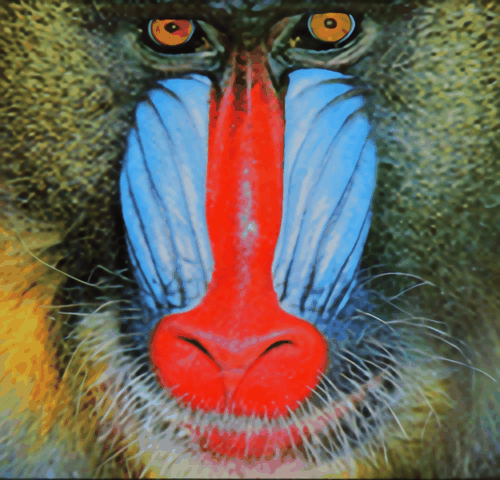

In [57]:
from IPython.display import Image
Image(open('results/baboon.gif','rb').read())

We can a continuous and smooth transition from PSNR-oriented outputs to GAN effects.